In [1]:
# core scientific libraries
import os
import sys
import numpy as np
import pandas as pd
import xarray as xr

# plotting
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.ticker as mticker
import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER


# secondary libraries
import netCDF4 as nc
from wrf import (to_np, getvar, smooth2d, get_cartopy, cartopy_xlim,
                 cartopy_ylim, latlon_coords)
from datetime import datetime
import metpy.calc as mpcalc
from metpy.units import units
import pytz

In [64]:
def wrf_hourly_subplots(data, data_units, data_name, data_cols, data_titles, title_y, des_hours, dur, ncols, nrows, width, \
                        height, bounds, skip, qwidth, qscale, stat_labels, spaces, U, V, w_speed, lats, lons, station_lons, \
                        station_lats, station_names, dates, cbar_bounds, topo_key, topo, topo_levels, outdir):
    """A function plot hourly WRF data into multiple subplots

    inputs:
    data: 2D array of data to be plotted
    data_units: object of data units
    data_name: string of data name for output file name
    data_cols: color of cmap desired
    data_titles: data title for subplots
    des_hours: string of desired hours to be plotted
    dur: length of desired hours
    ncols: integer of number of cols
    nrows: interger of number of rows
    width: desired width of figure
    height: desired height of figure
    bounds: list of map bounds [lon, lon, lat, lat]
    skip: integer of how many quiver should be skipped while plotting
    qscale: interger scale of quivers
    stat_labels: 0 if no station labels are desired, 1 if station labels are desired
    spaces: list of horizontal space and width space for subplots [hspace, wspace]
    U: 3D array of zonal winds
    V: 3D array of meridional winds
    lats: 1D array of lats
    lons: 1D array of Lons
    station_lons: list of station lons to be have labels plotted
    station_lats: list of station lats to be have labels plotted
    station_names: list of station names to be labels used
    outdir: output directory for image to be saved under"""

    # set map projection
    mapcrs = ccrs.PlateCarree() # mapcrs - what want in
    datacrs = ccrs.PlateCarree() # datacrs - what comes in

    # find min and max of data to make levels for the colorbar that is constant across all subplots
    dmax = np.ceil(np.nanmax(data.values))
    dmin = np.floor(np.nanmin(data.values))
    levels = np.arange(dmin, dmax, 2)
    
    # create figure
    fig = plt.figure(figsize = (width, height))
    gs = plt.GridSpec(nrows, ncols, figure = fig, hspace = spaces[0], wspace = spaces[1])

    # loop through each subplot 
    d = 0

    for r in range(nrows):
        
        for c in range(ncols):

            k = des_hours[d]
  
            # add plot axes 
            ax = fig.add_subplot(gs[r,c], projection=mapcrs)

            # set plot boundaries
            ax.set_extent(bounds, crs=mapcrs)

            # add map features
            ax.add_feature(cfeature.NaturalEarthFeature(category='physical', scale='10m',
                            facecolor='none', name='coastline'), edgecolor='black')

            # plot topographic lines if desired
            if (topo_key == True):
                ct = ax.contour(lons, lats, topo, transform = datacrs, colors = 'darkgrey', levels = topo_levels)
            
            # if its a wind plot, add quivers
#             if (data_name == 'wind'):
                                
#                 cf = ax.quiver(lons[::skip,::skip], lats[::skip,::skip], U[k,::skip,::skip], V[k,::skip,::skip], \
#                           w_speed[k,::skip,::skip], scale = qscale, \
#                           transform=datacrs, cmap = data_cols, pivot = 'middle', width = 0.01)
                
#             else:
                
            # data magntiude (contour filled) 
            cf = ax.contourf(lons, lats, data[k], transform = datacrs, cmap = data_cols, \
                             extend = 'both', levels = levels)

            # data barbs / vectors, displaying everything 10th one
            ax.quiver(lons[::skip], lats[::skip], U[k,::skip,::skip], V[k,::skip,::skip], 
                      width = qwidth, scale = qscale, transform = datacrs, color = 'black', pivot = 'middle')


        
            if (stat_labels == True):
                # plot stations as points
                plt.scatter(station_lons, station_lats, color = 'black', s = 10)

                for i in range(len(station_names)):

                    # display station names, making sure there is no overlaping text                
                    if station_names[i] == 'SBVC1':
                        plt.annotate(station_names[i], (station_lons[i], station_lats[i]), color = 'black', 
                                 textcoords='offset points', xytext=(-10,-15), ha = 'center', fontsize = 13)
                    elif station_names[i] == 'MOIC1':
                        plt.annotate(station_names[i], (station_lons[i], station_lats[i]), color = 'black', 
                                 textcoords='offset points', xytext=(20,0), ha = 'center', fontsize = 13)
                    else:
                        plt.annotate(station_names[i], (station_lons[i], station_lats[i]), color = 'black', 
                                 textcoords='offset points', xytext=(0,8), ha = 'center', fontsize = 13)

            # subtitles
            ax.set_title(str(dates[k])[0:16].replace("T"," "), loc = 'right')

            ## Add lat lon labels
            gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                              linewidth=2, color='gray', alpha=0.5, linestyle='--')
            gl.xlabels_top = False
            gl.ylabels_right = False
            gl.xlines = False
            gl.ylines = False
            gl.xlocator = mticker.FixedLocator([-119.25, -119.5, -119.75, -120, -120.25, -120.5])
            gl.xformatter = LONGITUDE_FORMATTER
            gl.yformatter = LATITUDE_FORMATTER
            
            d = d + 1

    # add title for all of subplots
    fig.suptitle(data_titles, fontsize = 16, x = 0.515, y = title_y)

    ax2 = fig.add_axes(cbar_bounds)
    cb = plt.colorbar(cf, cax=ax2,
                        orientation='horizontal', extendfrac='auto', label = data_units)

    # Display figure
    # save file name as start datetime end datetime and variable
    plot_name = data_name + '_' + str(bounds).replace(', ','_').replace('[','').replace(']','') + '_' + \
                'start_' + str(dates[des_hours[0]])[0:13].replace("T","_").replace("-","_") + '_end_' \
                + str(dates[des_hours[dur - 1]])[0:13].replace("T","_").replace("-","_") + '.png'

    plt.savefig(outdir+plot_name,  bbox_inches='tight', dpi = 120)
    plt.show()
    print('File saved as:', outdir+plot_name, '\n')

In [3]:
# Set filepath
datadir = '../input_data/wrf_out_post/'

# set file names
filename = ['wrfout_d03_2017-05-22_00:00:00_surf', 'wrfout_d03_2017-05-23_00:00:00_surf', 
            'wrfout_d03_2017-05-24_00:00:00_surf', 'wrfout_d03_2017-05-25_00:00:00_surf']  

# set output filepath
outdir = '/home/sbarc/students/coello/repos/classes/spring_2021/geog_288cj/plotting/outputs/'
fig_outdir = '/home/sbarc/students/coello/repos/classes/spring_2021/geog_288cj/plotting/outputs/figures/'
dat_outdir = '/home/sbarc/students/coello/repos/classes/spring_2021/geog_288cj/plotting/outputs/data/'

In [17]:



# station locations and names
# station_lats = [34.516658, 34.491333, 34.45580, 34.461397, 34.4450, 34.54440, 34.60694, 34.4261914]
# station_lons = [-120.075331, -119.796386, -119.70560, -119.649014, -119.625833, -119.79140, -120.07556, -119.8414927 ]
# station_names = ['RHWC1',  'MPWC1', 'SBVC1', 'MTIC1', 'MOIC1', 'LPOC1', 'KIZA', 'KSBA']

station_lats = [34.45580, 34.461397, 34.4450, 34.54440, 34.60694, 34.4261914]
station_lons = [-119.70560, -119.649014, -119.625833, -119.79140, -120.07556, -119.8414927 ]
station_names = ['SBVC1', 'MTIC1', 'MOIC1', 'LPOC1', 'KIZA', 'KSBA']

In [57]:
# specifiy desired wind units
wind_units = 'm/s'

da_list = []

for j in range(len(filename)):

    # open wrf Dataset object
    filepath = datadir + filename[j]
    dat = xr.open_dataset(filepath)
    print('Opened File:', filepath)

    # append xarray to a list
    da_list.append(dat)

# convert list of xarrays to one xarray
ds = xr.concat(da_list, dim = 'time')

Opened File: ../input_data/wrf_out_post/wrfout_d03_2017-05-22_00:00:00_surf
Opened File: ../input_data/wrf_out_post/wrfout_d03_2017-05-23_00:00:00_surf
Opened File: ../input_data/wrf_out_post/wrfout_d03_2017-05-24_00:00:00_surf
Opened File: ../input_data/wrf_out_post/wrfout_d03_2017-05-25_00:00:00_surf


/home/sbarc/students/coello/miniconda3/envs/wrf/lib/python3.7/site-packages/xarray/conventions.py:520: SerializationWarning: variable 'rh2' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,


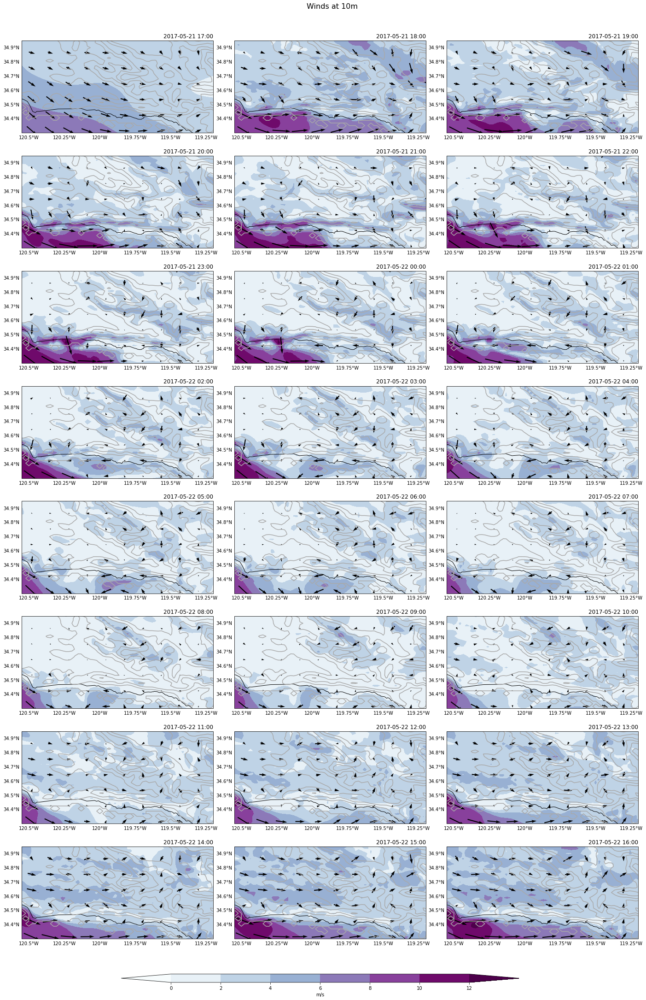

File saved as: /home/sbarc/students/coello/repos/classes/spring_2021/geog_288cj/plotting/outputs/figures/wind_-120.55_-119.2_34.3_34.95_start_2017_05_21_17_end_2017_05_22_16.png 



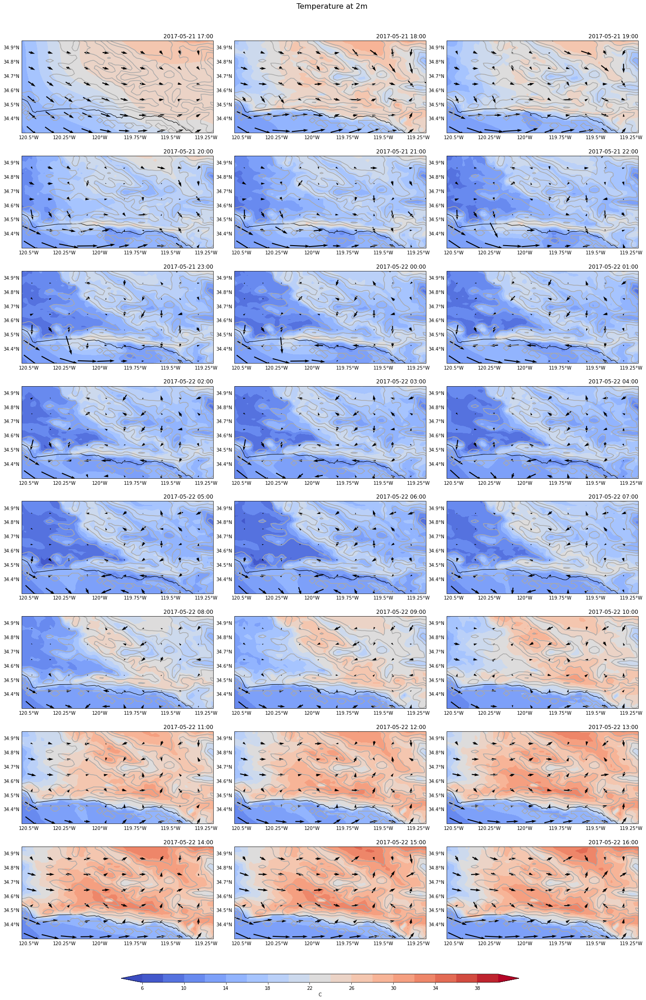

File saved as: /home/sbarc/students/coello/repos/classes/spring_2021/geog_288cj/plotting/outputs/figures/temp_-120.55_-119.2_34.3_34.95_start_2017_05_21_17_end_2017_05_22_16.png 



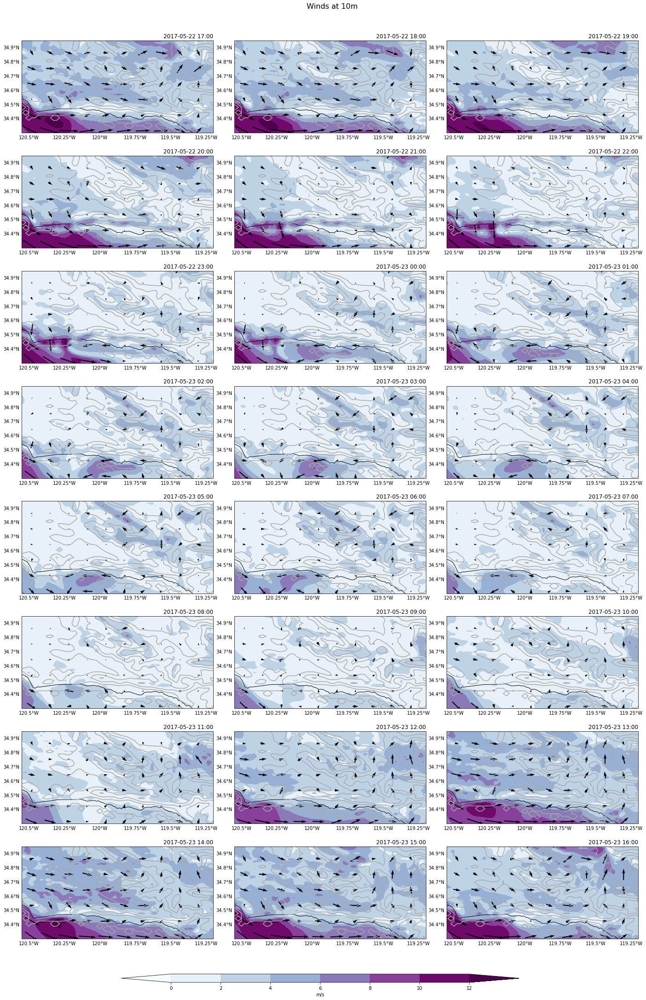

File saved as: /home/sbarc/students/coello/repos/classes/spring_2021/geog_288cj/plotting/outputs/figures/wind_-120.55_-119.2_34.3_34.95_start_2017_05_22_17_end_2017_05_23_16.png 



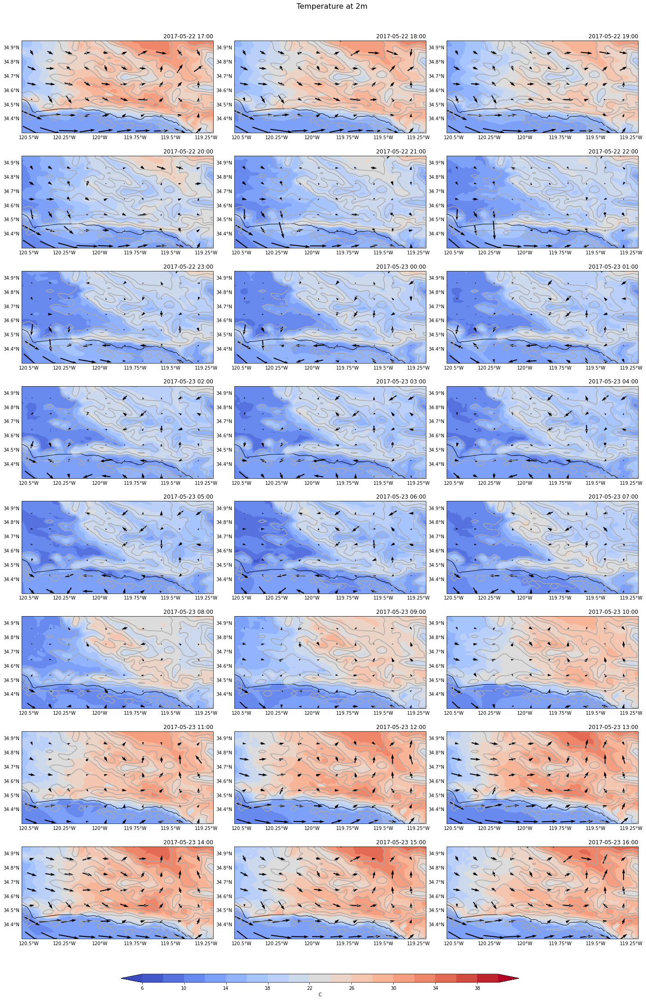

File saved as: /home/sbarc/students/coello/repos/classes/spring_2021/geog_288cj/plotting/outputs/figures/temp_-120.55_-119.2_34.3_34.95_start_2017_05_22_17_end_2017_05_23_16.png 



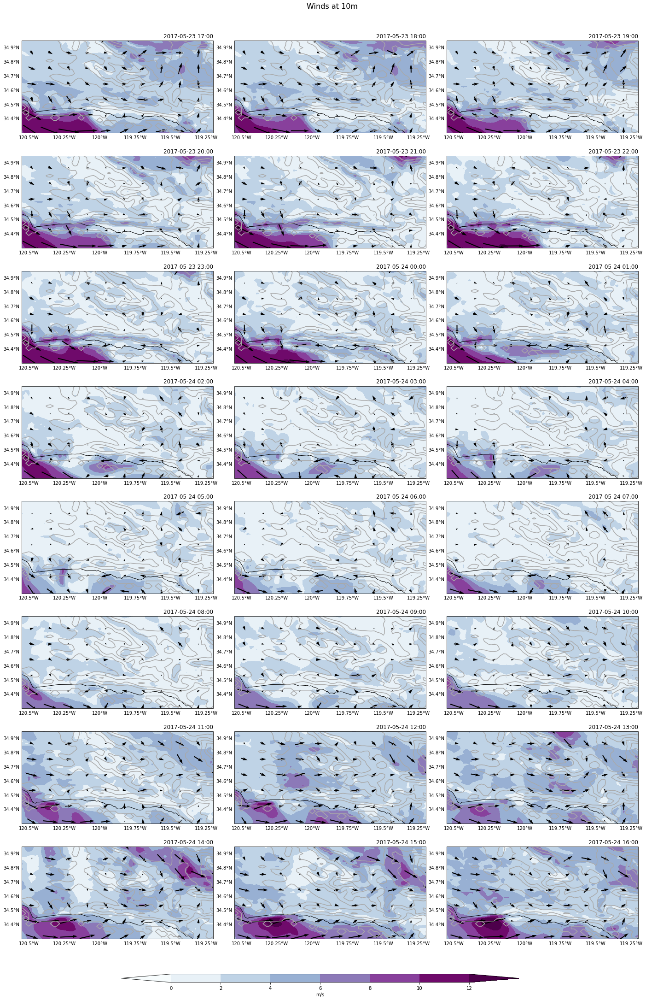

File saved as: /home/sbarc/students/coello/repos/classes/spring_2021/geog_288cj/plotting/outputs/figures/wind_-120.55_-119.2_34.3_34.95_start_2017_05_23_17_end_2017_05_24_16.png 



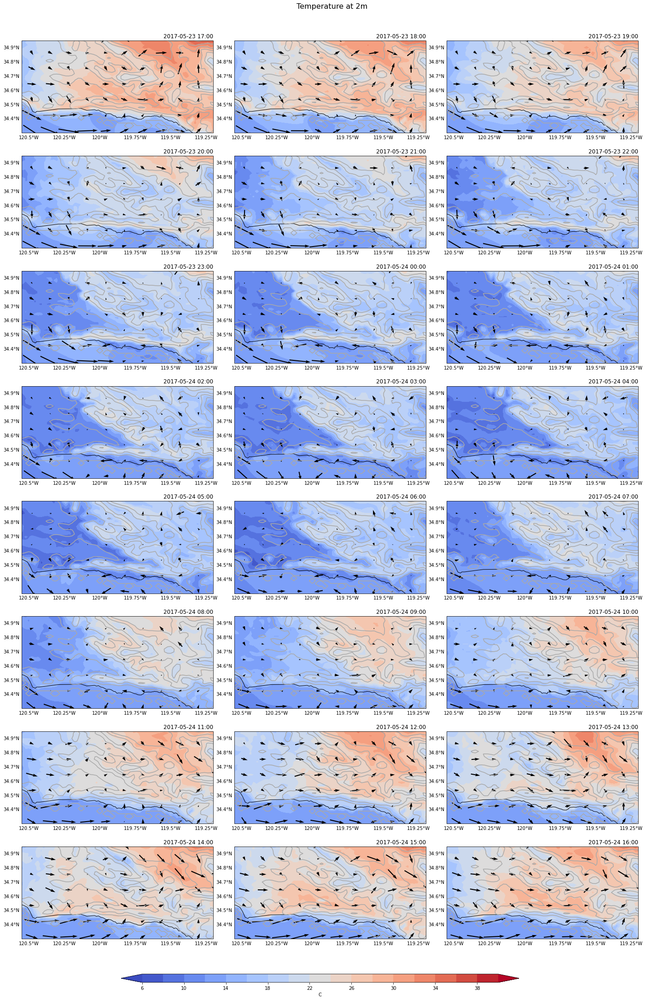

File saved as: /home/sbarc/students/coello/repos/classes/spring_2021/geog_288cj/plotting/outputs/figures/temp_-120.55_-119.2_34.3_34.95_start_2017_05_23_17_end_2017_05_24_16.png 



IndexError: index 13 is out of bounds for axis 0 with size 13

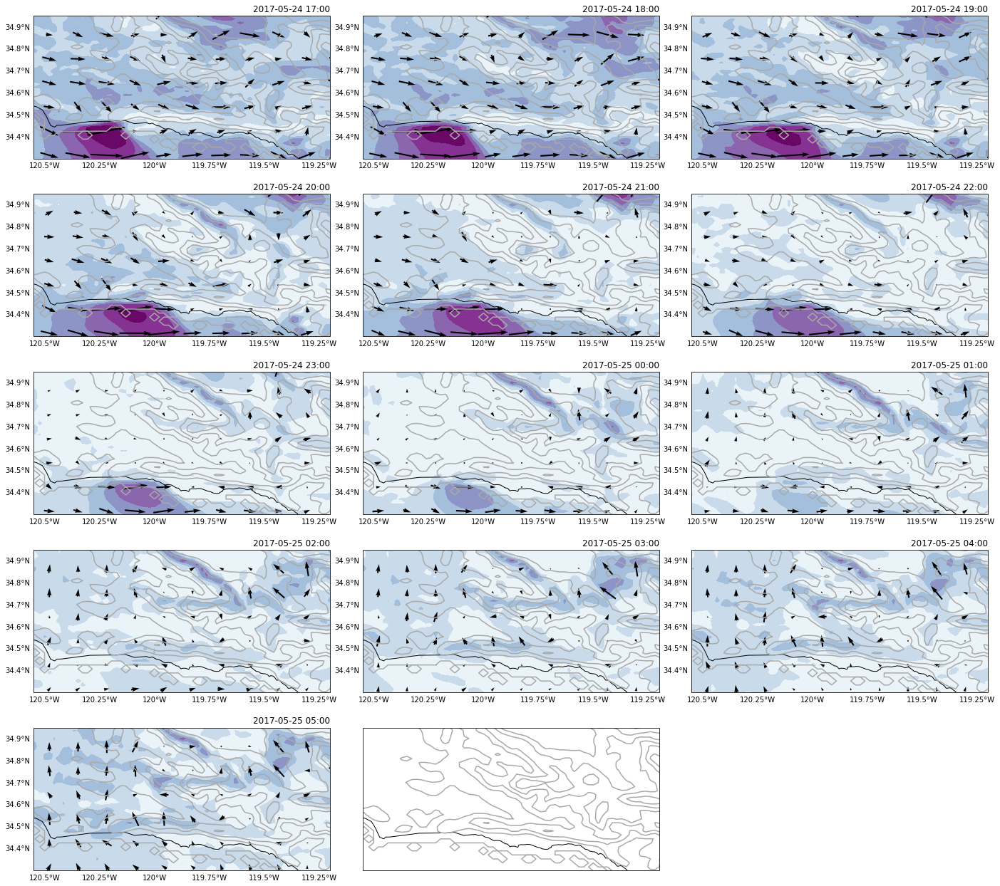

In [81]:
des_hours = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
dur = len(des_hours)

# set up subsfigure rows and columns
ncols = 3
nrows = int(dur/ncols)

# set topo contour levels
topo_levels = np.arange(0, 3000, 300)

# save lat and lons
lons = ds.lon
lats = ds.lat

# save topo
topo = ds.terr.sel(time = ds.time[0].values)

# save dates
dates_list = ds.time.values

for i in range(0, len(ds.time.values), 24):
    
    wrf_hourly_subplots(ds.wspd[i:i+24], wind_units, 'wind', 'BuPu', 'Winds at 10m', 0.91, des_hours, dur, \
                        ncols, nrows, int(ncols * 8), int(nrows * 4.5), [-120.55, -119.2, 34.3, 34.95], 6, 0.005, 100, \
                        False, [0.2, 0.11], ds.u[i:i+24], ds.v[i:i+24], ds.wspd[i:i+24], lats, lons, station_lons, station_lats, \
                        station_names, dates_list[i:i+24], [0.25, 0.09, 0.5, 0.007], True, topo, topo_levels, fig_outdir)    

    wrf_hourly_subplots(ds.T2[i:i+24], 'C', 'temp', 'coolwarm', 'Temperature at 2m', 0.91, des_hours, dur, \
                        ncols, nrows, int(ncols * 8), int(nrows * 4.5), [-120.55, -119.2, 34.3, 34.95], 6, 0.005, 100, \
                        False, [0.2, 0.11], ds.u[i:i+24], ds.v[i:i+24], ds.wspd[i:i+24], lats, lons, station_lons, station_lats, \
                        station_names, dates_list[i:i+24], [0.25, 0.09, 0.5, 0.007], True, topo, topo_levels, fig_outdir)    